# Data Visualization

In [1]:
import pandas as pd
import math
import numpy as np
import numpy as np
import pandas as pd
import shapefile as shp
import matplotlib.pyplot as plt
import seaborn as sns
from cancerolstools import preprocess as pp
from cancerolstools import visuals as vi

## Visualization 1: Anomaly Heatmap

In [2]:
fips_df = pp.import_fips()
cancer_df = pp.import_cancer()

For our first visualization, we were interested in analyzing the relationship between income and cancer mortality, as well as identifying if there were any “problem areas” geographically that may indicate a larger state or region-wide trend.

In [3]:
cancer_df = pp.cancer_preprocess(cancer_df)
cancer_df = pp.merge_data(cancer_df, fips_df)

graphdata = pp.graph_dataframe(cancer_df)
graphdata

,fips,anomalies
0,53035,0.000000
1,53037,0.000000
2,53039,0.000000
3,16061,0.000000
4,21135,0.000000
...,...,...
14223,48159,0.000000
14224,50011,0.000000
14225,51067,0.000000
14226,53021,0.000000


Firstly, we explored the ratio between our dependent variable, average cancer mortality per capita, and the median income for each county. To help symmetrize median income and thus our ratio, we first applied a log transformation, then calculated our ratios. Then, to identify any anomalies, that is, counties with an unusually high or small ratio, we standardized our ratio values, creating a new variable called “Anomalies,” representing the standard deviations away from the mean ratio. Finally, to focus on significant differences to the mean ratio, we changed any anomalies less than |1| to 0. The above code completes this processing and compiles the results in a dataframe with anomalies. For specific documentation and implementation, please visit the cancerolstools package.

In [4]:
from urllib.request import urlopen
import json
with urlopen('https://raw.githubusercontent.com/plotly/datasets/master/geojson-counties-fips.json') as response:
    counties = json.load(response)

import plotly.express as px


fig = vi.anomaly_map(graphdata)
fig.show()
fig.write_image('figures/Anomaly_Map.png')

We also wanted to only focus on positive anomalies, which represent a county with a high cancer mortality compared to its median income, and thus when graphing, only used color for positive anomalies larger than 1. Grey represents missing data, which mentioned previously, is not significant to consider when generalizing our results. 

As seen in the graph, nearly all of the positive anomalies are in the South-East region of the United States, indicating possibly a region-wide trend. When modeling, this implies that we should consider analyzing if a dummy variable that tells us whether or not a county is in the South-East region significantly affects average cancer mortality. If this dummy variable is found to be significant, it could be used to justify additional federal spending in this certain area of the country. Additionally, if this dummy variable is found to be significant, it also supports the relationship between median income and average cancer mortality, as it’s important to note in this visualization we aren’t modeling simply cancer mortality, but the ratio between cancer mortality and median income.  

## Visualization 2: Understanding Racial Effects on Mortality

While the heatmap informs us that the region is an important factor in the average cancer mortality rate, we begin to think about whether the effect of geopolitical factors on cancer might be reflected through racial demographic effects on cancer mortality.

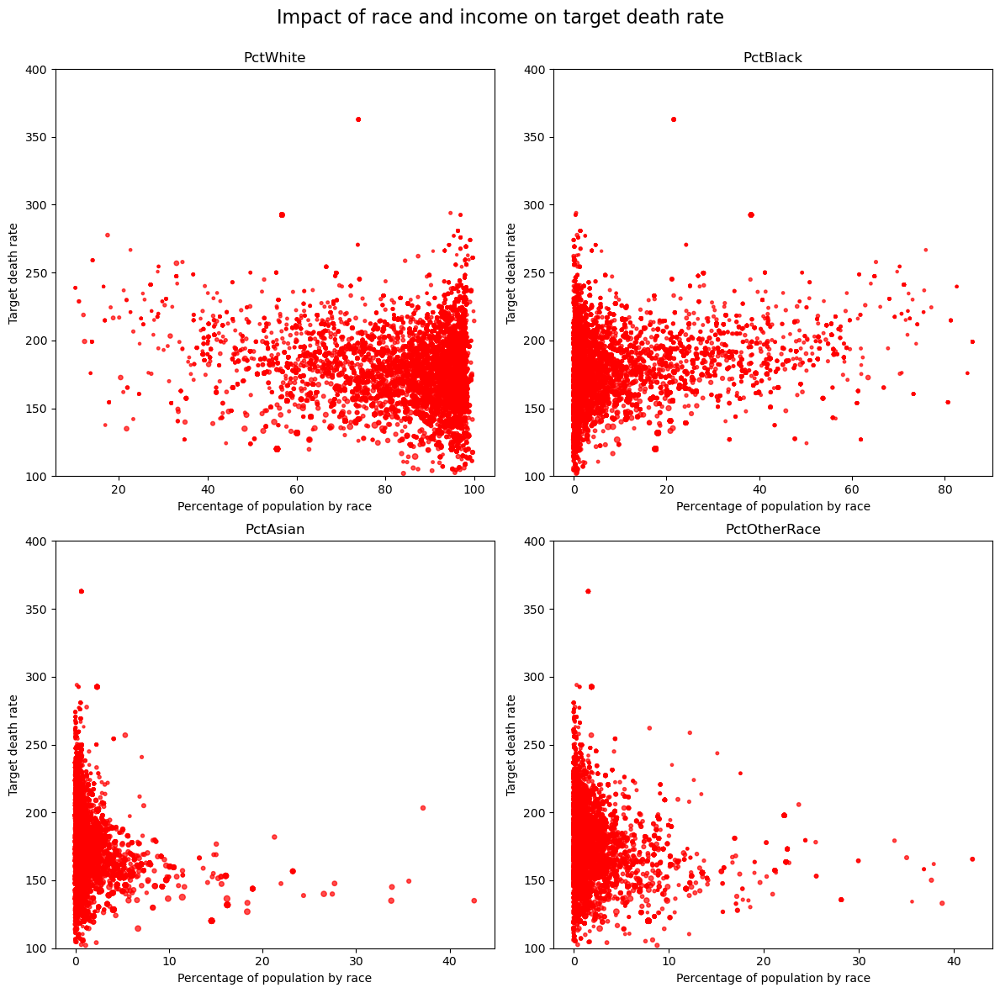

In [30]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from matplotlib.pyplot import figure


race_plot_df = vi.df_race(cancer_df)
fig = vi.race_income_plot(race_plot_df)

plt.suptitle('Impact of race and income on target death rate', fontsize=16)
plt.tight_layout()
plt.subplots_adjust(top=0.92)
plt.savefig('figures/Race_Income_Plot.png', dpi = 50)
plt.show()

By considering distribution percentages of different races in each county respectively from the dataset, as well as the median income, this faceted plot helps visualize the possible impact of race on annual average cancer mortality rate. Each point in the plot represents a county, each color of the point represents a specific race of that county. With the size of the dots representing the range of median income for that county. The grey line as trends for each racial of percentages of race vs cancer mortality is indicating they are not random and racial demographic should be classified as features. Including income helps us understand if it will be a confounding factor of races’ percentage and the cancer mortality.  Among each race, higher up on the vertical line, there appears to be a greater distribution of lower income (smaller points), while such distribution characteristics vary across racial density. This implies that our lower income groups appear to face greater cancer mortality, and that this effect of income on mortality varies by race.

The information obtained by this plot suggests that we should further consider the possibility of multicollinearity later in building our model, the effects of racial percentages and income on target mortality may vary by region or subpopulation, and differences will be taken into account when constructing our model and interpreting our results. The relationship between racial percentages, income, and the death rate are complex and non- linear, and we may have to better implement it through linearization and appropriate methods under specific consideration. We will explore linear modeling in the later notebooks.